In [3]:
import re
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
from local.lib.animation import animate

In [4]:
def get_f(pout, pattern='fm'):

    """
    Extracts the misfit from the given pout file.
    The FM value is expected to be in the format:
    ||fm(x)||^2 = <value>
    where <value> is a floating point number in scientific notation.
    :param txt: The input text containing the FM value.
    :return: A list of FM values found in the text.
    """

    matches =  re.findall(f"\|\|{pattern}\(x\)\|\|\^2\s*=\s*(\d+\.\d+e[+-]?\d+)", pout)
    return list(map(float, matches))

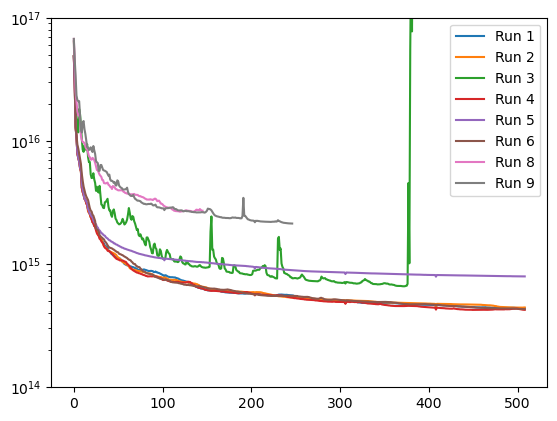

In [5]:
for i in range(1, 10):
    if i == 7:
        continue
    with open(f"/Users/jonniebarnsley/Downloads/axial_run0{i}.txt", 'r') as f:
        pout = f.read()
    fm_values = get_f(pout)
    plt.plot(fm_values, label=f"Run {i}")
plt.ylim(1e14, 1e17)
plt.yscale('log')
plt.legend()

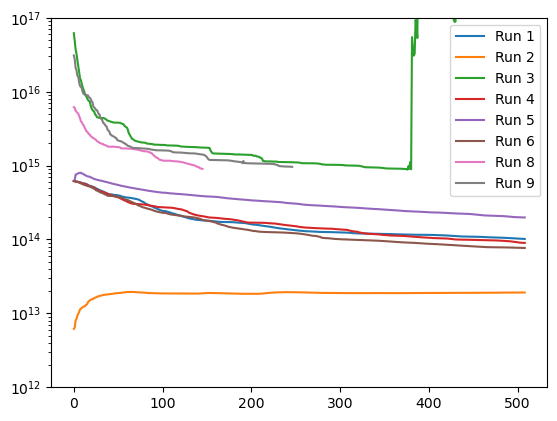

In [40]:
for i in range(1, 10):
    if i == 7:
        continue
    pout = f"/Users/jonniebarnsley/Downloads/axial_run0{i}.txt"
    fm_values = get_f(pout, pattern='fp')
    plt.plot(list(map(float, fm_values)), label=f"Run {i}")
plt.ylim(1e12, 1e17)
plt.yscale('log')
plt.legend()

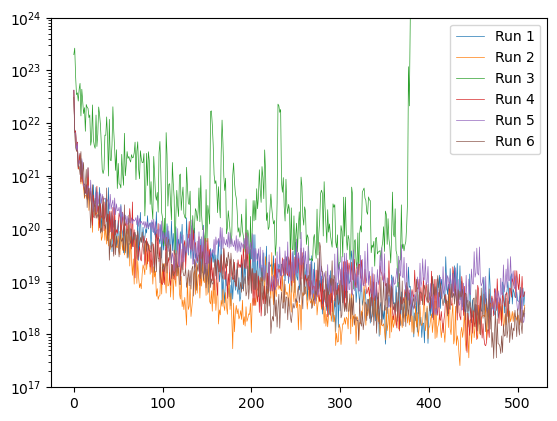

In [37]:
for i in range(1, 7):
    pout = f"/Users/jonniebarnsley/Downloads/axial_run0{i}.txt"
    fm_values = get_f(pout, pattern="f'")
    plt.plot(list(map(float, fm_values)), label=f"Run {i}", lw=0.5)
plt.ylim(1e17, 1e24)
plt.yscale('log')
plt.legend()

(1000000000000000.0, 9000000000000000.0)

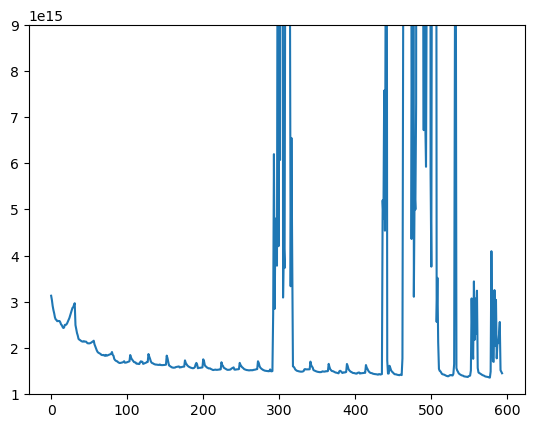

In [3]:
with xr.open_dataset('/Users/jonniebarnsley/Downloads/run16_steph_xVel_3lev.nc') as file:
    xVel = file.xVel
with xr.open_dataset('/Users/jonniebarnsley/Downloads/run16_steph_yVel_3lev.nc') as file:
    yVel = file.yVel

In [3]:
file = xr.open_dataset('/Users/jonniebarnsley/Downloads/antarctica_bedmachine_inverse_1km.nc')
btrc = file.btrc

In [4]:
print(btrc.min())
print(btrc.max())

<xarray.DataArray 'btrc' ()>
array(5.)
<xarray.DataArray 'btrc' ()>
array(200000.)


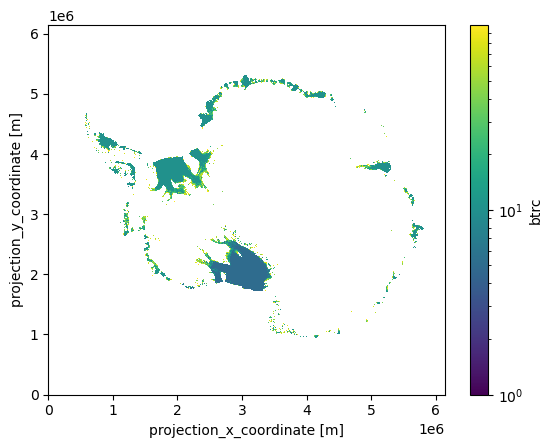

In [11]:
import matplotlib.colors as mcolors
test = btrc.where(btrc < 100)
test.plot(norm=mcolors.LogNorm(vmin=1))

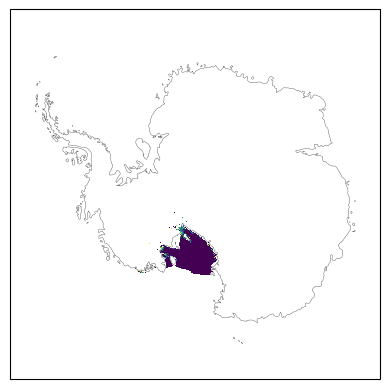

In [8]:
from local.lib.myplots import spatialPlot
import cartopy.crs as ccrs

fig = plt.figure()
ax = plt.axes(projection = ccrs.SouthPolarStereo())
spatialPlot(ax, test)

In [8]:
file = xr.open_dataset('/Users/jonniebarnsley/Downloads/muCoef/lasagne_run04_muCoef_0lev.nc')
file = file.assign_coords(time=range(len(file.time)))
file

<xarray.Dataset>
Dimensions:  (time: 302, y: 768, x: 768)
Coordinates:
  * x        (x) float64 4e+03 1.2e+04 2e+04 ... 6.124e+06 6.132e+06 6.14e+06
  * y        (y) float64 4e+03 1.2e+04 2e+04 ... 6.124e+06 6.132e+06 6.14e+06
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 294 295 296 297 298 299 300 301
Data variables:
    muCoef   (time, y, x) float64 ...

In [11]:
anim = animate(file.muCoef.sel(time=slice(0, None, 3)))

In [12]:
from IPython.display import HTML
HTML(anim.to_jshtml())

In [13]:
file = xr.open_dataset('/Users/jonniebarnsley/Downloads/muCoef/lasagne_run05_muCoef_0lev.nc')
file = file.assign_coords(time=range(len(file.time)))
file

<xarray.Dataset>
Dimensions:  (time: 320, y: 768, x: 768)
Coordinates:
  * x        (x) float64 4e+03 1.2e+04 2e+04 ... 6.124e+06 6.132e+06 6.14e+06
  * y        (y) float64 4e+03 1.2e+04 2e+04 ... 6.124e+06 6.132e+06 6.14e+06
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 312 313 314 315 316 317 318 319
Data variables:
    muCoef   (time, y, x) float64 ...

In [14]:
anim = animate(file.muCoef.sel(time=slice(0, None, 3)))
HTML(anim.to_jshtml())